In [91]:
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import lightkurve as lk
import tesswcs

from datetime import datetime
from scipy import ndimage
from glob import glob
from astropy.time import Time
from astropy.stats import sigma_clipped_stats
from astropy.io import fits
from tess_ephem import ephem
from tess_asteroids.utils import compute_moments
from tess_asteroids import MovingTPF
from tess_asteroids.utils import plot_img_aperture, animate_cube, calculate_TESSmag
from lkspacecraft import TESSSpacecraft
from lkspacecraft.spacecraft import BadEphemeris
from scipy.interpolate import CubicSpline

from IPython.display import HTML


In [19]:
tpfs = lk.TargetPixelFileCollection(
    [
        lk.read(x, quality_bitmask="none")
        for x in sorted(
            glob("../../data/2026/tpfs/tess2026015060000-s1751-*-0301-s_tp.fits")
        )
    ]
)
tpfs = tpfs[np.argsort([tpf.row for tpf in tpfs])]

In [20]:
target_spk = "DES = 1004083"  # this is the designation for 3I/ATLAS
target = "3I/ATLAS"
sector = 1751
camera = 2
ccd = 3

hlsp_ver = 2.0
cadence = "tpf-20s"
gif_step = 50

In [21]:
df_ephem, metadata = ephem(
    target_spk,
    sector=sector,
    time_step=0.01,
    orbital_elements=True,
    interpolation_step="3H",
)
# Add column for time in format (JD - 2457000) and scale TDB.
# Note: tess-ephem returns time in UTC at spacecraft, so we convert to TDB scale.
df_ephem["time"] = [t.btjd for t in df_ephem.index.values]
df_ephem["time"] += df_ephem["tdb-ut"] / 24 / 3600
df_ephem = df_ephem.reset_index(drop=True)
df_ephem.to_csv("../../data/2026/3iatlas_ephem_sector1751_20260326.csv")

# df_ephem = pd.read_csv("../../data/2026/3iatlas_ephem_sector1751_20260326.csv", index_col=0)
df_ephem


,sector,camera,ccd,column,row,tdb-ut,pixels_per_hour,ra,dec,vmag,hmag,sun_distance,obs_distance,sto_angle,time
0,1751,2,3,1730.399606,587.283958,69.184317,6.889316,130.774032,15.975676,16.373424,NaN,3.106215,2.145925,4.577303,4055.511601
1,1751,2,3,1730.407215,588.994152,69.184318,6.887862,130.764255,15.977831,16.373835,NaN,3.106534,2.146183,4.570905,4055.521601
2,1751,2,3,1730.414740,590.703808,69.184318,6.886408,130.754480,15.979984,16.374237,NaN,3.106853,2.146440,4.564508,4055.531601
3,1751,2,3,1730.422185,592.412930,69.184318,6.884955,130.744707,15.982137,16.374631,NaN,3.107171,2.146698,4.558110,4055.541601
4,1751,2,3,1730.429554,594.121518,69.184319,6.883503,130.734936,15.984287,16.375020,NaN,3.107490,2.146956,4.551713,4055.551601
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,1751,2,3,1733.523217,1750.199166,69.184526,5.807986,123.914293,17.361691,16.725974,NaN,3.345157,2.362259,0.695287,4062.961601
746,1751,2,3,1733.551680,1751.584736,69.184526,5.805946,123.905963,17.363382,16.726465,NaN,3.345480,2.362586,0.695105,4062.971601
747,1751,2,3,1733.580136,1752.969798,69.184526,5.803908,123.897636,17.365072,16.726965,NaN,3.345803,2.362912,0.694963,4062.981601
748,1751,2,3,1733.608586,1754.354355,69.184527,5.801872,123.889312,17.366762,16.727476,NaN,3.346125,2.363239,0.694861,4062.991601


In [22]:
# Rename keys in metadata dictionary
metadata["inclination"] = metadata.pop("orbital_inclination")
metadata["perihelion"] = metadata.pop("perihelion_distance")

# Add date of query to metadata dictionary
metadata["ephem_date"] = datetime.now().strftime("%Y-%m-%d")
metadata

{'eccentricity': 6.140044763695067,
 'inclination': 175.11382172227462,
 'perihelion': 1.3564526631436942,
 'ephem_date': '2026-03-26'}

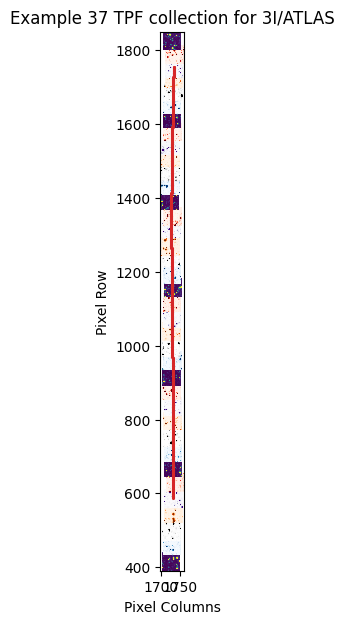

In [23]:
# inspect the cutouts are ok
fig, ax = plt.subplots(1, 1, figsize=(9, 7))
ax.set_title(f"Example {len(tpfs)} TPF collection for {target}")
ax.set_xlabel("Pixel Columns")
ax.set_ylabel("Pixel Row")
cols = []
rows = []
cmaps = ["viridis", "Blues", "Grays", "Oranges", "Purples", "Reds"]
for i, tpf in enumerate(tpfs):
    row = np.arange(tpf.row, tpf.row + tpf.shape[1])
    col = np.arange(tpf.column, tpf.column + tpf.shape[2])
    cols.append(col)
    rows.append(row)
    ax.pcolormesh(
        col,
        row,
        tpf.flux[500].value,
        vmin=0,
        vmax=300,
        cmap=cmaps[i % len(cmaps)],
    )
ax.set_aspect("equal", "box")
ax.scatter(df_ephem.column, df_ephem.row, c="tab:red", s=1.5)
# ax.set_xlim()
# ax.set_ylim(1000, 1500)
plt.show()


In [ ]:
# Now we need to rewrite the `get_data` methods in `tess_asteroids.MovingTPF`
# to make it work with this Collection of TPFs

class MovingTPF_Collection(MovingTPF):

    def __init__(
        self,
        target: str,
        ephem: pd.DataFrame,
        barycentric: bool = True,
        metadata: dict = {},
    ):
        super().__init__(
            target,
            ephem,
            barycentric,
            metadata,
        )

    def get_data_tpfs(
        self, 
        tpfs: lk.TargetPixelFileCollection, 
        shape: tuple[int, int] = (11, 11), 
        cutout: bool = True,
        use_spoc_bg: bool = True,
                     ):
        """
        Function to parse the pixel time series in a collection of TPFs

        Parameters
        ----------
        tpfs: lk.TargetPixelFileCollection
            Collection of TPF objects from lightkurve
        """
        # uncorrecting time to be TDB at the spacecraft
        time = (
            tpfs[0].time
            if self.barycentric
            else tpfs[0].time - tpfs[0].hdu["PIXELS"].data["TIMECORR"]
        )
        time = time.btjd

        # Use interpolation to get target (row,column) at cube time.
        # If input ephem["time"] is in TDB at spacecraft, convert cube time for interpolation.
        column_interp = CubicSpline(
            self.ephem["time"].astype(float),
            self.ephem["column"].astype(float),
            extrapolate=False,
        )(time)
        row_interp = CubicSpline(
            self.ephem["time"].astype(float),
            self.ephem["row"].astype(float),
            extrapolate=False,
        )(time)

        # Remove nans from interpolated position
        nan_mask = np.logical_and(~np.isnan(column_interp), ~np.isnan(row_interp))
        row_interp, column_interp = row_interp[nan_mask], column_interp[nan_mask]

        # cadence
        cadence = np.median(np.diff(time))
        # Original FFI timestamps of each frame in the data cube, in TDB at SS barycenter.
        self.time_original = time[nan_mask]
        # Original time correction of each frame in the data cube.
        self.timecorr_original = tpfs[0].hdu["PIXELS"].data["TIMECORR"][nan_mask]
        # Time at start of the exposure.
        self.tstart = time[nan_mask] - cadence / 2
        # Time at end of the exposure.
        self.tstop = time[nan_mask] + cadence / 2
        # SPOC quality flag of each frame in the data cube.
        self.quality = tpfs[0].quality[nan_mask]
        # Unique cadence number of each frame in the data cube, as defined by tesscube.
        self.cadence_number = tpfs[0].cadenceno[nan_mask]
        # Predicted (row,column) of target.
        self.ephemeris = np.asarray([row_interp, column_interp]).T

        # put fluxes into ntimes x npix shape
        all_flux, all_flux_err = [], []
        sl_model, sl_model_err = [], []
        locs = []
        for tpf in tpfs:
            # extract frame data and reshape to (ntimes, npix)
            all_flux.append(tpf.flux.value.reshape(tpf.shape[0], -1))
            all_flux_err.append(tpf.flux_err.value.reshape(tpf.shape[0], -1))
            sl_model.append(tpf.flux_bkg.value.reshape(tpf.shape[0], -1))
            sl_model_err.append(tpf.flux_bkg_err.value.reshape(tpf.shape[0], -1))
            # extract pixel locations and reshape to (2, npix)
            locs.append(
                np.mgrid[
                    tpf.row : tpf.row + tpf.shape[1],
                    tpf.column : tpf.column + tpf.shape[2],
                ].reshape(2, np.prod(tpf.shape[1:]))
            )
        # reshape all collection of image data to (ntimes, npix) and locs to (2, npix)
        all_flux = np.array(all_flux).transpose(1, 0, 2).reshape(tpf.shape[0], -1)
        all_flux_err = np.array(all_flux_err).transpose(1, 0, 2).reshape(tpf.shape[0], -1)
        sl_model = np.array(sl_model).transpose(1, 0, 2).reshape(tpf.shape[0], -1)
        sl_model_err = np.array(sl_model_err).transpose(1, 0, 2).reshape(tpf.shape[0], -1)
        locs = np.array(locs).transpose(1, 0, 2).reshape(2, -1)

        # Unique Pixels only
        _, unique_pix = np.unique(locs, axis=1, return_index=True)
        unique_pix = np.in1d(np.arange(len(locs[0])), unique_pix)

        locs = locs[:, unique_pix]
        self.all_row, self.all_column = locs
        self.pixels = locs.T

        self.all_flux = all_flux[:, unique_pix]
        self.all_flux_err = all_flux_err[:, unique_pix]
        sl_model = sl_model[:, unique_pix]
        sl_model_err = sl_model_err[:, unique_pix]

        # remove nan frames
        self.all_flux = self.all_flux[nan_mask]
        self.all_flux_err = self.all_flux_err[nan_mask]
        sl_model = sl_model[nan_mask]
        sl_model_err = sl_model_err[nan_mask]

        # find max column wise edges
        self.col_edges_min = []
        self.col_edges_max = []
        for tpf in tpfs:
            self.col_edges_min.append(tpf.column)
            self.col_edges_max.append(tpf.column + tpf.shape[2])
        self.col_edges_min = np.max(self.col_edges_min)
        self.col_edges_max = np.min(self.col_edges_max) - 1

        # make sure cutout shape is not larger than available pixels between max column edges
        if self.col_edges_max - self.col_edges_min + 1 < shape[1]:
            print(f"Cutout shape {shape} is too large for the available columns between {self.col_edges_min} to {self.col_edges_max}.")
            shape = (shape[0], self.col_edges_max - self.col_edges_min + 1)
            print(f"Reducing cutout column size to {shape[1]}.")

        if (shape[0]//2 > self.all_row.max() - self.ephemeris[:, 0].max()) or (
            shape[0]//2 > self.ephemeris[:, 0].min() - self.all_row.min()
        ):
            print(f"Cutout row size {shape[0]//2} is larger than available rows.")
            shape = (
                np.minimum(
                    self.all_row.max() - self.ephemeris[:, 0].max(),
                    self.ephemeris[:, 0].min() - self.all_row.min(),
                ).astype(int) - 1,
                shape[1],
            )
            print(f"Reducing cutout row size to {shape[0]}.")
        self.shape = shape

        # Coordinates (row,column) of lower left corner of region to cutout around target
        self.corner = np.ceil(
            np.asarray(
                [row_interp - self.shape[0] / 2, column_interp - self.shape[1] / 2]
            ).T
        ).astype(int)

        # get row/columns grid from corner for each frame
        row, column = np.mgrid[: shape[0], : shape[1]]
        row = (
            np.repeat(row[None, :, :], self.time_original.shape[0], axis=0)
            + self.corner[:, 0][:, None, None]
        )
        column = (
            np.repeat(column[None, :, :], self.time_original.shape[0], axis=0)
            + self.corner[:, 1][:, None, None]
        )

        # Pixel mask that tracks moving target with cutout
        target_mask = []
        for t in range(len(self.time_original)):
            target_mask.append(
                np.logical_and(
                    np.isin(self.all_row, row[t].ravel()),
                    np.isin(self.all_column, column[t].ravel()),
                ),
            )
        self.target_mask = np.asarray(target_mask)

        # only keep pixels inside the cutout if asked
        if cutout:
            keep_pixels = self.target_mask.any(axis=0)
            self.all_row = self.all_row[keep_pixels]
            self.all_column = self.all_column[keep_pixels]
            self.all_flux = self.all_flux[:, keep_pixels]
            self.all_flux_err = self.all_flux_err[:, keep_pixels]
            self.target_mask = self.target_mask[:, keep_pixels]
            self.pixels = self.pixels[keep_pixels]
            sl_model = sl_model[:, keep_pixels]
            sl_model_err = sl_model_err[:, keep_pixels]

        # store SPOC background model if requested, otherwise add to flux and flux_err
        if use_spoc_bg:
            self.sl_model = sl_model
            self.sl_model_err = sl_model_err
            self.bad_spoc_bits = "n/a"
            self.sl_method = "SPOC"
        else:
            # SPOC bkg model is a constant value in space that changes in time
            # this bkg does not have errors
            self.all_flux += sl_model
            # self.all_flux_err += sl_model_err

        # Convert (row,column) ephemeris to (ra,dec) using WCS from tesswcs.
        # Note: if MovingTPF was initialised from_name, then tess-ephem
        # internally converted (ra,dec) to (row,column) using tesswcs.
        # `self.coords` does not recover these original values because the
        # ephemeris has since been interpolated.
        # Note: pixel_to_world() assumes zero-indexing so subtract one from (row,col).
        self.wcs = tesswcs.WCS.from_sector(
            sector=self.sector, camera=self.camera, ccd=self.ccd
        )
        self.coords = np.asarray(
            [
                self.wcs.pixel_to_world(
                    self.ephemeris[t, 1] - 1, self.ephemeris[t, 0] - 1
                )
                for t in range(len(self.time_original))
            ]
        )

        try:
            time_sc = self.time_original - self.timecorr_original
            # Catch warnings.
            with warnings.catch_warnings(record=True) as recorded_warnings:
                tess = TESSSpacecraft()
                # Get unique warnings and save to logger.
                for w in list(
                    {
                        "{0}-{1}".format(w.filename, w.lineno): w
                        for w in recorded_warnings
                    }.values()
                ):
                    print("Warning from TESSSpacecraft(): {0}".format(w))
        
            timecorr = []
            for t in range(len(time_sc)):
                timecorr.append(
                    tess.get_barycentric_time_correction(
                        time=Time(time_sc[t] + 2457000, scale="tdb", format="jd"),
                        ra=self.coords[t].ra.value,
                        dec=self.coords[t].dec.value,
                    )[0]
                    / 60
                    / 60
                    / 24
                )
            self.timecorr = np.asarray(timecorr)
            self.time = time_sc + self.timecorr
        except BadEphemeris:
            print(
                "Barycentric correction was not calculated due to missing SPICE kernels."
            )
            self.timecorr = self.timecorr_original
            self.time = self.time_original

        # remove frames full of nans
        nan_frames = np.isnan(mtpf.all_flux).all(axis=1)
        if (nan_frames).sum() > 0:
            nan_frames = np.logical_not(nan_frames)
            self.time_original = self.time_original[nan_frames]
            self.timecorr_original = self.timecorr_original[nan_frames]
            self.tstart = self.tstart[nan_frames]
            self.tstop = self.tstop[nan_frames]
            self.quality = self.quality[nan_frames]
            self.cadence_number = self.cadence_number[nan_frames]
            self.ephemeris = self.ephemeris[nan_frames]
            self.all_flux = self.all_flux[nan_frames]
            self.all_flux_err = self.all_flux_err[nan_frames]
            self.corner = self.corner[nan_frames]
            self.target_mask = self.target_mask[nan_frames]
            self.time = self.time[nan_frames]
            self.timecorr = self.timecorr[nan_frames]
            self.coords = self.coords[nan_frames]
            if use_spoc_bg:
                self.sl_model = self.sl_model[nan_frames]
                self.sl_model_err = self.sl_model_err[nan_frames]
        
        # Interpolate observing geometry parameters onto observation times
        # Note: interpolation will fail if any value is not finite.
        self.obs_params = {}
        for param in ["sun_distance", "obs_distance", "sto_angle"]:
            if param in self.ephem and np.isfinite(self.ephem[param].values).all():
                val = CubicSpline(
                    self.ephem["time"].astype(float),
                    self.ephem[param].astype(float),
                    extrapolate=False,
                )(self.time if self.barycentric else self.time - self.timecorr)
            else:
                val = np.full(len(self.time), np.nan)

            self.obs_params[param] = val
            
        return

In [29]:
mtpf = MovingTPF_Collection(target=target, ephem=df_ephem, metadata=metadata)

In [30]:
mtpf.get_data_tpfs(tpfs=tpfs, shape=(111, 35), cutout=True, use_spoc_bg=False)

Cutout row size 111 is larger than available rows.
Reducing cutout row size to 93.


Data for Sector 1751 has not been archived yet. This function will return the predicted WCS for Sector 1751.


Warning from TESSSpacecraft(): {message : ErfaWarning('ERFA function "dtf2d" yielded 1 of "dubious year (Note 6)"'), category : 'ErfaWarning', filename : '/Users/jimartin/miniforge3/envs/tess-asteroids/lib/python3.10/site-packages/erfa/core.py', lineno : 133, line : None}


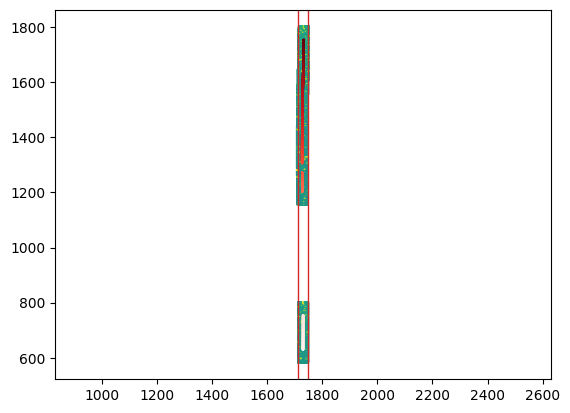

In [32]:
plt.scatter(
    mtpf.all_column,
    mtpf.all_row,
    c=mtpf.all_flux[100],
    s=1,
    vmin=100,
    vmax=500,
    cmap="viridis",
)
plt.scatter(
    mtpf.ephemeris[:, 1], mtpf.ephemeris[:, 0], c=mtpf.time_original, s=0.5, cmap="Reds"
)
plt.axis("equal")
plt.axvline(mtpf.col_edges_min, c="tab:red", lw=1)
plt.axvline(mtpf.col_edges_max, c="tab:red", lw=1)
plt.show()

In [33]:
mtpf.reshape_data()
mtpf.flux.shape, mtpf.flux_err.shape

((3044, 93, 35), (3044, 93, 35))

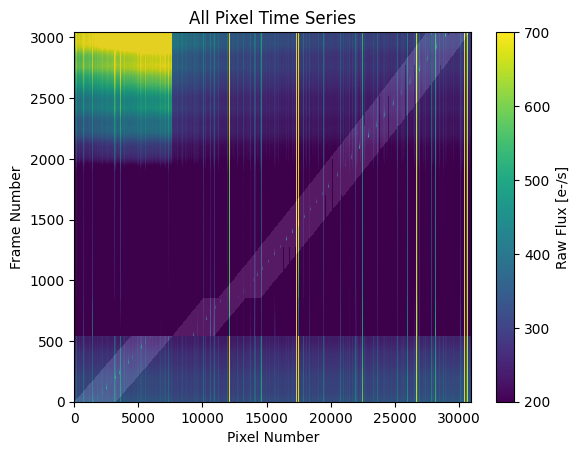

In [35]:
plt.title("All Pixel Time Series")
bar = plt.imshow(
    mtpf.all_flux,
    aspect="auto",
    origin="lower",
    interpolation="none",
    alpha=1.0,
    cmap="viridis",
    vmin=200,
    vmax=700,
)
plt.colorbar(bar, label="Raw Flux [e-/s]")
plt.imshow(
    mtpf.target_mask,
    aspect="auto",
    origin="lower",
    interpolation="none",
    alpha=0.1,
    cmap="gray",
)
plt.xlabel("Pixel Number")
plt.ylabel("Frame Number")
plt.show()


In [42]:
# this animation won't show in the GHI notebook viewer
ani = animate_cube(
    mtpf.flux,
    corner=mtpf.corner,
    ephemeris=mtpf.ephemeris,
    cadenceno=np.arange(len(mtpf.time_original)),
    time=mtpf.time_original,
    step=gif_step,
    vmin=200,
    vmax=600,
    suptitle=f"{mtpf.target} Sector {mtpf.sector} Camera {mtpf.camera} CCD {mtpf.ccd} Raw Flux",
)
# ani.save(f"../../data/2026/figures/tess_3iatlas_spoc_s1751_{cadence}_tp_raw.gif", writer="pillow")
HTML(ani.to_jshtml())

In [38]:
# find data breaks due to diwnlink
break_points = np.where(np.diff(mtpf.time) > 0.1)[0] + 1
break_points = np.concatenate([[0], break_points.tolist(), [len(mtpf.time)]]).ravel()

# make a 2d array mask with the data chunks from hte gaps
data_chuncks = []
for s, e in zip(break_points[:-1], break_points[1:]):
    aux = np.zeros(len(mtpf.time)).astype(bool)
    aux[s:e] = True
    data_chuncks.append(aux)
data_chuncks = np.array(data_chuncks)
data_chuncks


array([[ True,  True,  True, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ...,  True,  True,  True]])

In [39]:
# Create mask for moving target and stars.
source_mask = mtpf._create_source_mask(
    include_stars=True, 
    include_target=True, 
    all_flux=True, 
    target_threshold=0.001,
    star_flux_threshold=1.09,
)

Warning from `prf.evaluate()`: {message : LKPRFWarning('`targets` contains collateral pixels: Row(s) > 2048)'), category : 'LKPRFWarning', filename : '/Users/jimartin/miniforge3/envs/tess-asteroids/lib/python3.10/site-packages/lkprf/tessprf.py', lineno : 62, line : None}
Warning from `prf.evaluate()`: {message : LKPRFWarning('`targets` contains collateral pixels: Row(s) > 2048)'), category : 'LKPRFWarning', filename : '/Users/jimartin/miniforge3/envs/tess-asteroids/lib/python3.10/site-packages/lkprf/tessprf.py', lineno : 62, line : None}


In [ ]:
# this animation won't show in the GHI notebook viewer
ani = animate_cube(
    mtpf.flux,
    aperture_mask=np.array(
        [M[m].reshape(mtpf.shape) for M, m in zip(source_mask, mtpf.target_mask)]
    ),
    corner=mtpf.corner,
    ephemeris=mtpf.ephemeris,
    cadenceno=np.arange(len(mtpf.time_original)),
    time=mtpf.time_original,
    step=gif_step,
    # vmin=200,
    # vmax=600,
    suptitle=f"{mtpf.target} Sector {mtpf.sector} Camera {mtpf.camera} CCD {mtpf.ccd} Raw Flux",
)
HTML(ani.to_jshtml())


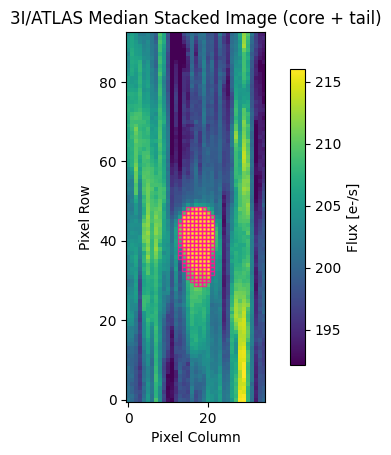

In [45]:
# make a median stacked image using sigma clipping statistics
med_stack = sigma_clipped_stats(mtpf.flux[mtpf.quality == 0], axis=0)[1]
# define a threshold to make the aperture
total_ap_param = 16
total_aperture_mask = med_stack > total_ap_param * med_stack.std()

# we dilate the aperture to make sure we capture all flux
total_aperture_mask = ndimage.binary_dilation(total_aperture_mask, iterations=1)
struct_y = np.array([[0, 1, 0], [0, 1, 0], [0, 0, 0]], dtype=bool)
total_aperture_mask = ndimage.binary_dilation(
    total_aperture_mask, iterations=5, structure=struct_y
)

# aperture over median stacked image
plot_img_aperture(
    sigma_clipped_stats(mtpf.flux[mtpf.quality == 0], axis=0)[
        1
    ],  # median stack after sigma clipping
    aperture_mask=total_aperture_mask,
    title=f"{mtpf.target} Median Stacked Image (core + tail)",
    # vmin=-1,
    # vmax=2,
);


In [46]:
# now reshape the target mask to the desired shape [ntimes, nrows x ncols]
# we make a pixel grid (row/col) for all cadences using the corner info
mask_row_grid, mask_col_grid = np.array(
    [
        np.mgrid[cr : cr + mtpf.shape[0], cc : cc + mtpf.shape[1]]
        for cr, cc in mtpf.corner
    ]
).transpose(1, 0, 2, 3)  # shape (n_cadences, y, x, 2)
# we select only the pixels inside the aperture across all cadences
mask_pixel = np.array(
    [
        f"{r}_{c}"
        for r, c in zip(
            mask_row_grid[:, total_aperture_mask].flatten(),
            mask_col_grid[:, total_aperture_mask].flatten(),
        )
    ]
)
# we make a list of all pixel positions in the mTPF (all frames)
all_pixels = np.array([f"{r}_{c}" for r, c in mtpf.pixels])

# fill in the locations of the aperture mask in the full mTPF mask
total_aperture_mask_all = np.zeros_like(mtpf.all_flux, dtype=bool)

# for each time step, find which pixels are in the aperture
for t in range(len(mtpf.time)):
    total_aperture_mask_all[t] = np.isin(
        all_pixels,
        mask_pixel[
            t * np.sum(total_aperture_mask) : (t + 1) * np.sum(total_aperture_mask)
        ],
    )


In [47]:
mtpf.background_correction(
    method="linear_model",
    bad_spoc_bits="none",  # reject bad SPOC quality frames [6]
    data_chunks=data_chuncks,  # define data breaks due to downlink or other gaps
    sl_method="pca",  # use SPOC background model
    sl_knot_width=15,
    sl_sigma=5,
    ncomponents=8,
    sl_niter_clip=3,
    knot_width=0.3,
    window_length=2,  # window length in days for the star model
    sigma=3,  # SNR threshold to select star pixels
    niter_clip=0,
    red_chi2_tol=2,
    diagnostic_plot=True,  # make diagnostic plot
    target_threshold=0.01,
    target_mask=total_aperture_mask_all,
)

# creates the pixel quality flags
mtpf.create_pixel_quality()
# we will create a temporal aperture
# this aperture will be replaced by a more informed one later
mtpf.create_aperture(method="prf")


Warning from `prf.evaluate()`: {message : LKPRFWarning('`targets` contains collateral pixels: Row(s) > 2048)'), category : 'LKPRFWarning', filename : '/Users/jimartin/miniforge3/envs/tess-asteroids/lib/python3.10/site-packages/lkprf/tessprf.py', lineno : 62, line : None}
Warning from `prf.evaluate()`: {message : LKPRFWarning('`targets` contains collateral pixels: Row(s) > 2048)'), category : 'LKPRFWarning', filename : '/Users/jimartin/miniforge3/envs/tess-asteroids/lib/python3.10/site-packages/lkprf/tessprf.py', lineno : 62, line : None}


Using user-defined target mask for star model.


 36%|███▌      | 11228/30985 [00:49<01:35, 206.25it/s]When computing the star model for pixel 11235 (row 1259, column 1710) in iteration 0, there were no times to fit. The model was set to nan at all times.
When computing the star model for pixel 11235 (row 1259, column 1710) in iteration 0, there were no times to fit. The model was set to nan at all times.
100%|█████████▉| 30868/30985 [02:44<00:00, 623.33it/s]When computing the star model for pixel 30915 (row 1801, column 1717) in iteration 0, there were no times to fit. The model was set to nan at all times.
When computing the star model for pixel 30915 (row 1801, column 1717) in iteration 0, there were no times to fit. The model was set to nan at all times.
When computing the star model for pixel 30916 (row 1801, column 1718) in iteration 0, there were no times to fit. The model was set to nan at all times.
When computing the star model for pixel 30916 (row 1801, column 1718) in iteration 0, there were no times to fit. The model was

In [ ]:
# this animation won't show in the GHI notebook viewer
mtpf.animate_tpf(
    show_aperture=False,
    vmin=-2,
    vmax=20,
    step=gif_step,
    
)


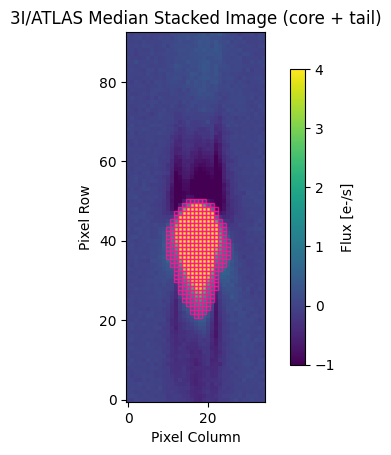

Warning from `prf.evaluate()`: {message : LKPRFWarning('`targets` contains collateral pixels: Row(s) > 2048)'), category : 'LKPRFWarning', filename : '/Users/jimartin/miniforge3/envs/tess-asteroids/lib/python3.10/site-packages/lkprf/tessprf.py', lineno : 62, line : None}
Warning from `prf.evaluate()`: {message : LKPRFWarning('`targets` contains collateral pixels: Row(s) > 2048)'), category : 'LKPRFWarning', filename : '/Users/jimartin/miniforge3/envs/tess-asteroids/lib/python3.10/site-packages/lkprf/tessprf.py', lineno : 62, line : None}


Using user-defined target mask for star model.


 36%|███▌      | 11214/30985 [00:38<01:16, 259.08it/s]When computing the star model for pixel 11235 (row 1259, column 1710) in iteration 0, there were no times to fit. The model was set to nan at all times.
When computing the star model for pixel 11235 (row 1259, column 1710) in iteration 0, there were no times to fit. The model was set to nan at all times.
100%|█████████▉| 30873/30985 [02:06<00:00, 509.01it/s]When computing the star model for pixel 30915 (row 1801, column 1717) in iteration 0, there were no times to fit. The model was set to nan at all times.
When computing the star model for pixel 30915 (row 1801, column 1717) in iteration 0, there were no times to fit. The model was set to nan at all times.
When computing the star model for pixel 30916 (row 1801, column 1718) in iteration 0, there were no times to fit. The model was set to nan at all times.
When computing the star model for pixel 30916 (row 1801, column 1718) in iteration 0, there were no times to fit. The model was

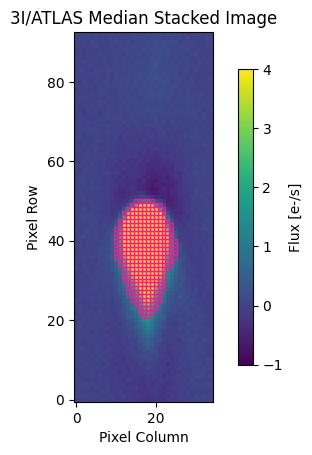

In [51]:
# make a median stacked image using sigma clipping statistics
med_stack = sigma_clipped_stats(mtpf.corr_flux[mtpf.quality == 0], axis=0)[1]
# define a threshold to make the aperture
total_ap_param = 0.1
total_aperture_mask = med_stack > total_ap_param * med_stack.std()

# we dilate the aperture to make sure we capture all flux
total_aperture_mask = ndimage.binary_dilation(total_aperture_mask, iterations=1)
struct_y = np.array([[0, 1, 0], [0, 1, 0], [0, 0, 0]], dtype=bool)
total_aperture_mask = ndimage.binary_dilation(
    total_aperture_mask, iterations=2, structure=struct_y
)

# aperture over median stacked image
plot_img_aperture(
    sigma_clipped_stats(mtpf.corr_flux[mtpf.quality == 0], axis=0)[
        1
    ],  # median stack after sigma clipping
    aperture_mask=total_aperture_mask,
    title=f"{mtpf.target} Median Stacked Image (core + tail)",
    vmin=-1,
    vmax=4,
)
plt.show()

# now reshape the target mask to the desired shape [ntimes, nrows x ncols]
# we make a pixel grid (row/col) for all cadences using the corner info
mask_row_grid, mask_col_grid = np.array(
    [
        np.mgrid[cr : cr + mtpf.shape[0], cc : cc + mtpf.shape[1]]
        for cr, cc in mtpf.corner
    ]
).transpose(1, 0, 2, 3)  # shape (n_cadences, y, x, 2)
# we select only the pixels inside the aperture across all cadences
mask_pixel = np.array(
    [
        f"{r}_{c}"
        for r, c in zip(
            mask_row_grid[:, total_aperture_mask].flatten(),
            mask_col_grid[:, total_aperture_mask].flatten(),
        )
    ]
)
# we make a list of all pixel positions in the mTPF (all frames)
all_pixels = np.array([f"{r}_{c}" for r, c in mtpf.pixels])

# fill in the locations of the aperture mask in the full mTPF mask
total_aperture_mask_all = np.zeros_like(mtpf.all_flux, dtype=bool)

# for each time step, find which pixels are in the aperture
for t in range(len(mtpf.time)):
    total_aperture_mask_all[t] = np.isin(
        all_pixels,
        mask_pixel[
            t * np.sum(total_aperture_mask) : (t + 1) * np.sum(total_aperture_mask)
        ],
    )

# makes the background model and corrects the data
mtpf.background_correction(
    method="linear_model",
    bad_spoc_bits="none",  # reject bad SPOC quality frames
    data_chunks=data_chuncks,  # define data breaks due to downlink or other gaps
    sl_method="pca",  # model background with PCA
    sl_knot_width=20,
    sl_sigma=5,
    sl_niter_clip=3,
    knot_width=0.35,
    window_length=1,  # window length in days for the star model
    sigma=3,  # SNR threshold to select star pixels
    niter_clip=3,
    red_chi2_tol=2,
    diagnostic_plot=True,  # make diagnostic plot
    target_threshold=0.001,
    target_mask=total_aperture_mask_all,  # we provide the new aperture
)

# aperture over median stacked image
plot_img_aperture(
    sigma_clipped_stats(mtpf.corr_flux[mtpf.quality == 0], axis=0)[
        1
    ],  # median stack after sigma clipping
    aperture_mask=total_aperture_mask,
    title=f"{mtpf.target} Median Stacked Image",
    vmin=-1,
    vmax=4,
)
plt.show()

# this animation won't show in the GHI notebook viewer
mtpf.animate_tpf(
    show_aperture=False,
    vmin=-2,
    vmax=20,
    step=gif_step,
    # save=True,
    # file_name=f"tess_3iatlas_spoc_s1751_{cadence}_tp_corrected.gif",
    # outdir="../../data/2026/figures/",
)


In [52]:
mtpf.create_aperture(method="prf", threshold=0.001)

# save pixel data to a FITS file
file_name = f"hlsp_tess-3i_tess_{cadence}_3iatlas-s{sector}-cam{camera}-ccd{ccd}_tess_v{hlsp_ver}_tp.fits"
print(file_name)
mtpf.to_fits(
    file_type="tpf",
    save=True,
    outdir="../../data/2026/",
    file_name=file_name,
)


hlsp_tess-3i_tess_tpf-20s_3iatlas-s1751-cam2-ccd3_tess_v2.0_tp.fits


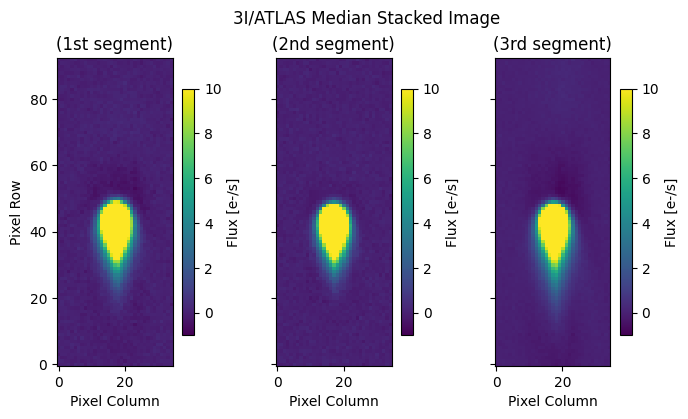

In [61]:
med_stack1 = sigma_clipped_stats(
    mtpf.corr_flux[(mtpf.quality == 0) & data_chuncks[0]], axis=0
)[1]
med_stack2 = sigma_clipped_stats(
    mtpf.corr_flux[(mtpf.quality == 0) & data_chuncks[1]], axis=0
)[1]
med_stack3 = sigma_clipped_stats(
    mtpf.corr_flux[(mtpf.quality == 0) & data_chuncks[2]], axis=0
)[1]

fig, ax = plt.subplots(1, 3, figsize=(8, 4), sharex=True, sharey=True)
fig.suptitle(f"{mtpf.target} Median Stacked Image", x=0.55, y=1.0, fontsize="large")
plot_img_aperture(
    med_stack1,
    # aperture_mask=total_aperture_mask,
    title=f"\n(1st segment)",
    vmin=-1,
    vmax=10,
    ax=ax[0],
)
plot_img_aperture(
    med_stack2,
    # aperture_mask=total_aperture_mask,
    title="\n(2nd segment)",
    vmin=-1,
    vmax=10,
    ax=ax[1],
)
plot_img_aperture(
    med_stack3,
    # aperture_mask=total_aperture_mask,
    title="\n(3rd segment)",
    vmin=-1,
    vmax=10,
    ax=ax[2],
)
ax[1].set_ylabel("")
ax[2].set_ylabel("")
plt.show()


In [63]:
org_ephemeris = mtpf.ephemeris.copy()


Threshold: 0.01
Row offset     0.6167 +- 0.1133
Column offset -0.1266 +- 0.1179
Threshold: 0.001
Row offset     1.0753 +- 0.1242
Column offset -0.1830 +- 0.1086


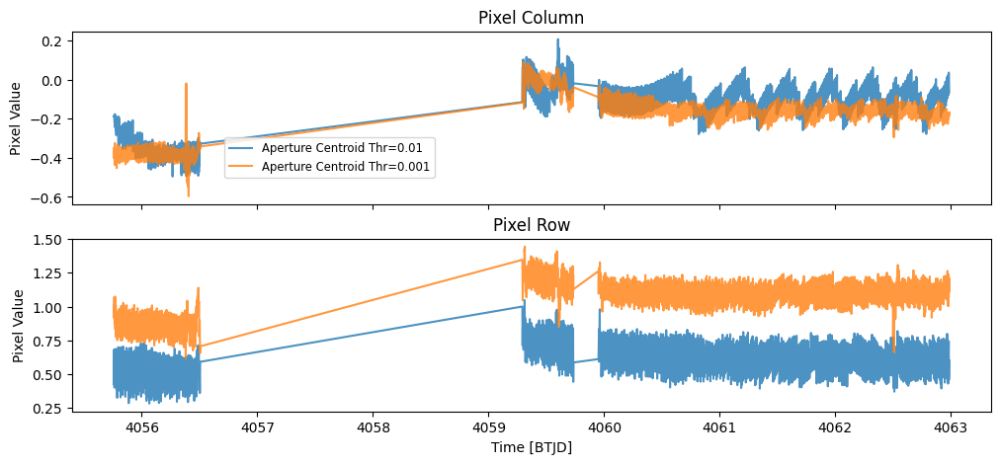

In [64]:
mtpf.ephemeris = org_ephemeris.copy()
fig, ax = plt.subplots(2, 1, figsize=(12, 5), sharex=True)
offsets = {}
for thr in [0.01, 0.001]:
    print(f"Threshold: {thr}")
    mtpf.create_aperture(threshold=thr)

    col_cen, row_cen, col_cen2, row_cen2, cr_cen = compute_moments(
        mtpf.corr_flux, mtpf.aperture_mask, second_order=True, return_err=False
    )

    offset_row = mtpf.ephemeris[:, 0] - (row_cen + mtpf.corner[:, 0])
    offset_col = mtpf.ephemeris[:, 1] - (col_cen + mtpf.corner[:, 1])
    offsets[thr] = (offset_row, offset_col, row_cen2, col_cen2, cr_cen)

    print(f"Row offset     {offset_row.mean():.4f} +- {offset_row.std():.4f}")
    print(f"Column offset {offset_col.mean():.4f} +- {offset_col.std():.4f}")

    ax[0].plot(
        mtpf.time,
        offset_col,
        # c="tab:blue",
        alpha=0.8,
        label=f"Aperture Centroid Thr={thr}",
    )

    ax[1].errorbar(
        mtpf.time,
        offset_row,
        # c="tab:blue",
        alpha=0.8,
    )
ax[0].set_title("Pixel Column")
ax[0].legend(loc="best", bbox_to_anchor=(0.16, 0.42), fontsize="small")
ax[1].set_title("Pixel Row")
ax[-1].set_xlabel("Time [BTJD]")
ax[0].set_ylabel("Pixel Value")
ax[1].set_ylabel("Pixel Value")

plt.show()


In [65]:
mtpf.ephemeris = org_ephemeris.copy()
mtpf.ephemeris[:, 0] -= offsets[0.001][0]
mtpf.ephemeris[:, 1] -= offsets[0.001][1]

In [66]:
# makes the PRF-based aperture
mtpf.create_aperture(threshold=0.01)
# we will save the core aperture and use it later
core_aperture_mask1, core_ap_param1 = mtpf.aperture_mask, mtpf.ap_param

# makes the PRF-based aperture
mtpf.create_aperture(threshold=0.001)
# we will save the core aperture and use it later
core_aperture_mask2, core_ap_param2 = mtpf.aperture_mask, mtpf.ap_param


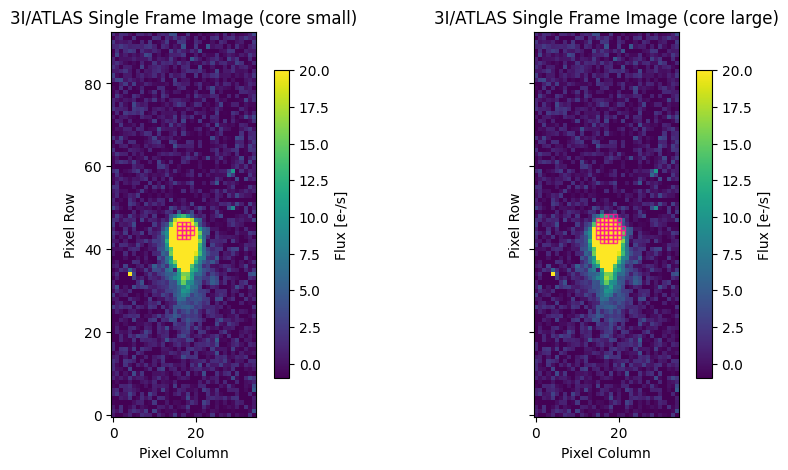

In [67]:
nt = 1500
fig, ax = plt.subplots(1, 2, figsize=(10, 5), sharey=True, sharex=True)
# aperture over median stacked image
plot_img_aperture(
    mtpf.corr_flux[nt],
    aperture_mask=core_aperture_mask1[nt],
    title=f"{mtpf.target} Single Frame Image (core small)",
    vmin=-1,
    vmax=20,
    ax=ax[0],
)
# ax[0].set_xlim(20, 50)
# ax[0].set_ylim(20, 70)

# aperture over median stacked image
plot_img_aperture(
    mtpf.corr_flux[nt],
    aperture_mask=core_aperture_mask2[nt],
    title=f"{mtpf.target} Single Frame Image (core large)",
    vmin=-1,
    vmax=20,
    ax=ax[1],
)
plt.savefig(
    f"../../data/2026/figures/tess_3iatlas_spoc_s1751_{cadence}_core_apertures.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()


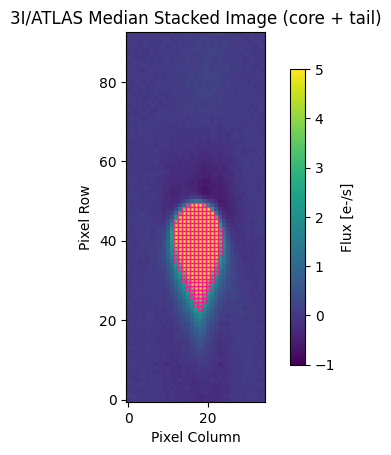

In [75]:
# make a median stacked image using sigma clipping statistics
med_stack = sigma_clipped_stats(mtpf.corr_flux[mtpf.quality == 0], axis=0)[1]
# define a threshold to make the aperture
total_ap_param = 0.2
total_aperture_mask = med_stack > total_ap_param * med_stack.std()

# aperture over median stacked image
plot_img_aperture(
    sigma_clipped_stats(mtpf.corr_flux[mtpf.quality == 0], axis=0)[
        1
    ],  # median stack after sigma clipping
    aperture_mask=total_aperture_mask,
    title=f"{mtpf.target} Median Stacked Image (core + tail)",
    vmin=-1,
    vmax=5,
)
plt.savefig(
    f"../../data/2026/figures/tess_3iatlas_spoc_s1751_{cadence}_total_apertures.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

# Offset between expected target position and center of TPF
pos_corr1 = mtpf.ephemeris[:, 1] - mtpf.corner[:, 1] - 0.5 * (mtpf.shape[1] - 1)
pos_corr2 = mtpf.ephemeris[:, 0] - mtpf.corner[:, 0] - 0.5 * (mtpf.shape[0] - 1)

# jitter total aperture mask according to pos_corr1 and pos_corr2
total_aperture_mask_jittered = np.array(
    [
        ndimage.shift(
            total_aperture_mask.astype(float),
            shift=(dy, dx),
            order=0,
            mode="nearest",
            prefilter=False,
        ).astype(bool)
        for dy, dx in zip(pos_corr2, pos_corr1)
    ]
)

In [77]:
lc = {"aperture": []}
for thr in [0.01, 0.001]:
    # makes the PRF-based aperture
    mtpf.create_aperture(threshold=thr)
    # we will save the core aperture and use it later
    core_aperture_mask, core_ap_param = mtpf.aperture_mask, mtpf.ap_param
    # we assign the current aperture
    mtpf.aperture_mask = core_aperture_mask
    mtpf.ap_param = core_ap_param
    # we use the hidden method to perform aperture photometry se we can keep multiple apertures
    lc["aperture"].append(mtpf._aperture_photometry())

# repeat the steps with the new aperture
# we need to repeat the aperture mask for each time frame
mtpf.aperture_mask = total_aperture_mask_jittered
mtpf.ap_param = total_ap_param
lc["aperture"].append(mtpf._aperture_photometry())

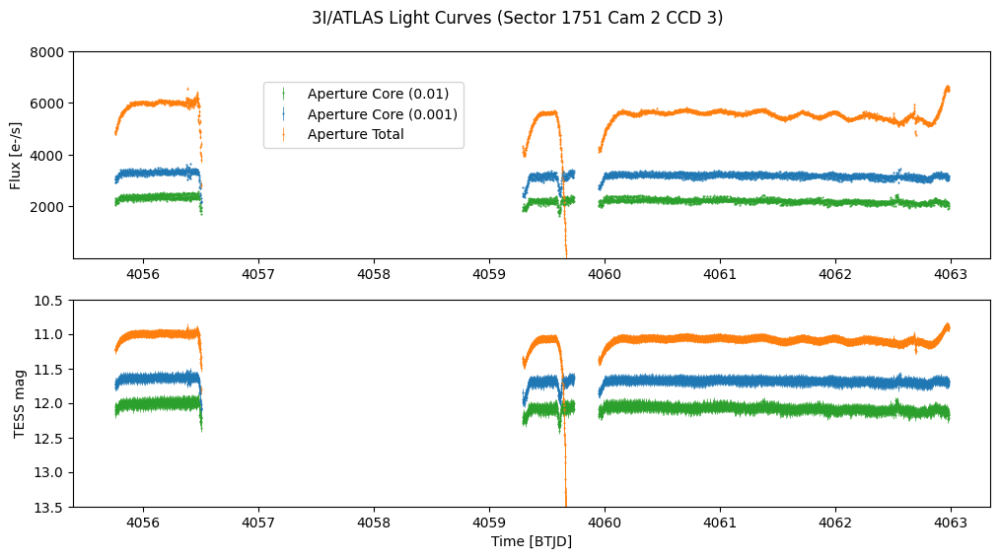

In [78]:
fig, ax = plt.subplots(2, 1, figsize=(12, 6))
fig.suptitle(
    f"{mtpf.target} Light Curves (Sector {sector} Cam {camera} CCD {ccd})", y=0.95
)
cs = ["tab:green", "tab:blue"]
for k in range(len(lc["aperture"]) - 1):
    ax[0].errorbar(
        lc["aperture"][k]["time"],
        lc["aperture"][k]["flux"],
        yerr=lc["aperture"][k]["flux_err"],
        ms=1,
        lw=0.5,
        fmt=".",
        label=f"Aperture Core ({lc['aperture'][k]['ap_param']})",
        c=cs[k],
    )
    ax[1].errorbar(
        lc["aperture"][k]["time"],
        lc["aperture"][k]["TESSmag"],
        yerr=lc["aperture"][k]["TESSmag_err"],
        ms=1,
        lw=0.5,
        fmt=".",
        c=cs[k],
    )
ax[0].errorbar(
    lc["aperture"][-1]["time"],
    lc["aperture"][-1]["flux"],
    yerr=lc["aperture"][-1]["flux_err"],
    ms=1,
    lw=0.5,
    fmt=".",
    label="Aperture Total",
    c="tab:orange",
)
ax[1].errorbar(
    lc["aperture"][-1]["time"],
    lc["aperture"][-1]["TESSmag"],
    yerr=lc["aperture"][-1]["TESSmag_err"],
    ms=1,
    lw=0.5,
    fmt=".",
    label="Aperture Total",
    c="tab:orange",
)

ax[0].legend(loc="best", ncols=1, bbox_to_anchor=(0.2, 0.5))
ax[0].set_ylim(10, 8000)
ax[1].set_ylim(10.5, 13.5)

ax[-1].set_xlabel("Time [BTJD]")
ax[0].set_ylabel("Flux [e-/s]")
ax[1].set_ylabel("TESS mag")
# ax[0].set_yscale("log")

ax[1].invert_yaxis()

plt.savefig(
    f"../../data/2026/figures/tess_3iatlas_spoc_s1751_{cadence}_lc.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()


In [79]:
# we make a mask for the stars, this mask has shape [ntimes, npix]
star_mask = mtpf._create_source_mask(include_stars=True, target_threshold=0.9999)
# we recover the comet mask (core and total)
core_mask = mtpf._create_source_mask(include_stars=False, target_threshold=0.01)


# aperture with core + tail reshaped to all pixels
# now reshape the target mask to the desired shape [ntimes, nrows x ncols]
# we make a pixel grid (row/col) for all cadences using the corner info
mask_row_grid, mask_col_grid = np.array(
    [
        np.mgrid[cr : cr + mtpf.shape[0], cc : cc + mtpf.shape[1]]
        for cr, cc in mtpf.corner
    ]
).transpose(1, 0, 2, 3)  # shape (n_cadences, y, x, 2)
# we select only the pixels inside the aperture across all cadences
mask_pixel = np.array(
    [
        f"{r}_{c}"
        for r, c in zip(
            mask_row_grid[:, total_aperture_mask].flatten(),
            mask_col_grid[:, total_aperture_mask].flatten(),
        )
    ]
)
# we make a list of all pixel positions in the mTPF (all frames)
all_pixels = np.array([f"{r}_{c}" for r, c in mtpf.pixels])

# fill in the locations of the aperture mask in the full mTPF mask
total_aperture_mask_all = np.zeros_like(mtpf.all_flux, dtype=bool)

# for each time step, find which pixels are in the aperture
for t in range(len(mtpf.time)):
    total_aperture_mask_all[t] = np.isin(
        all_pixels,
        mask_pixel[
            t * np.sum(total_aperture_mask) : (t + 1) * np.sum(total_aperture_mask)
        ],
    )

# iterate over frames to find number of overlapping pixels between star and comet masks
star_x_core = []
star_x_comet = []
for cdx in range(len(mtpf.cadence_number)):
    star_x_core.append((core_mask[cdx] & star_mask[cdx]).sum())
    star_x_comet.append((total_aperture_mask_all[cdx] & star_mask[cdx]).sum())
star_x_core = np.array(star_x_core)
star_x_comet = np.array(star_x_comet)


Warning from `prf.evaluate()`: {message : LKPRFWarning('`targets` contains collateral pixels: Row(s) > 2048)'), category : 'LKPRFWarning', filename : '/Users/jimartin/miniforge3/envs/tess-asteroids/lib/python3.10/site-packages/lkprf/tessprf.py', lineno : 62, line : None}
Warning from `prf.evaluate()`: {message : LKPRFWarning('`targets` contains collateral pixels: Row(s) > 2048)'), category : 'LKPRFWarning', filename : '/Users/jimartin/miniforge3/envs/tess-asteroids/lib/python3.10/site-packages/lkprf/tessprf.py', lineno : 62, line : None}
Warning from `prf.evaluate()`: {message : LKPRFWarning('`targets` contains collateral pixels: Row(s) > 2048)'), category : 'LKPRFWarning', filename : '/Users/jimartin/miniforge3/envs/tess-asteroids/lib/python3.10/site-packages/lkprf/tessprf.py', lineno : 62, line : None}
Warning from `prf.evaluate()`: {message : LKPRFWarning('`targets` contains collateral pixels: Row(s) > 2048)'), category : 'LKPRFWarning', filename : '/Users/jimartin/miniforge3/envs/t

In [ ]:
import lightkurve as lk
from lightkurve.correctors import (
    DesignMatrix,
    RegressionCorrector,
    DesignMatrixCollection,
)

In [ ]:
# create lightkurve objects to use the RegressionCorrector
lc_core1 = lk.LightCurve(
    time=lc["aperture"][0]["time"],
    flux=lc["aperture"][0]["flux"],
    flux_err=lc["aperture"][0]["flux_err"],
)
lc_core2 = lk.LightCurve(
    time=lc["aperture"][1]["time"],
    flux=lc["aperture"][1]["flux"],
    flux_err=lc["aperture"][1]["flux_err"],
)
lc_total = lk.LightCurve(
    time=lc["aperture"][-1]["time"],
    flux=lc["aperture"][-1]["flux"],
    flux_err=lc["aperture"][-1]["flux_err"],
)

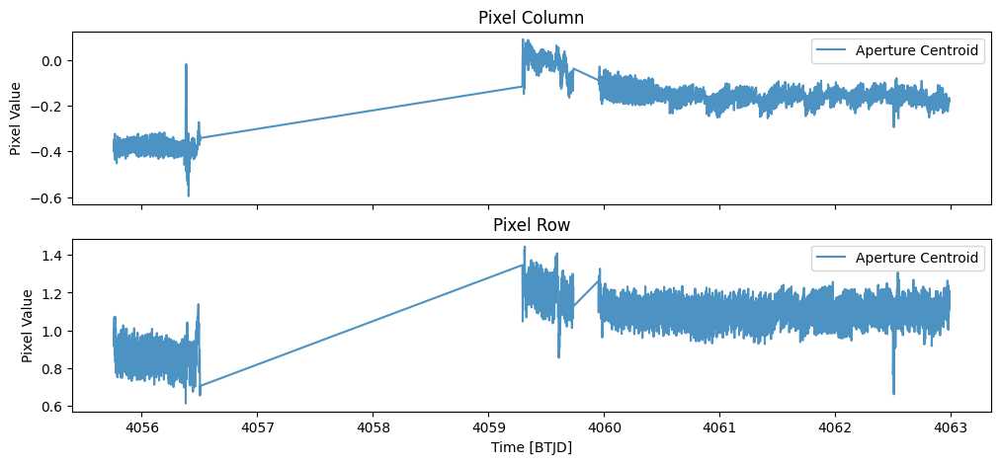

In [82]:
fig, ax = plt.subplots(2, 1, figsize=(12, 5), sharex=True)
ax[0].set_title("Pixel Column")

ax[0].plot(
    mtpf.time,
    offsets[0.001][1],
    c="tab:blue",
    alpha=0.8,
    label="Aperture Centroid",
)
ax[0].legend()
ax[1].set_title("Pixel Row")
ax[1].errorbar(
    mtpf.time,
    offsets[0.001][0],
    c="tab:blue",
    alpha=0.8,
    label="Aperture Centroid",
)
ax[1].legend()
ax[-1].set_xlabel("Time [BTJD]")
ax[0].set_ylabel("Pixel Value")
ax[1].set_ylabel("Pixel Value")

plt.show()

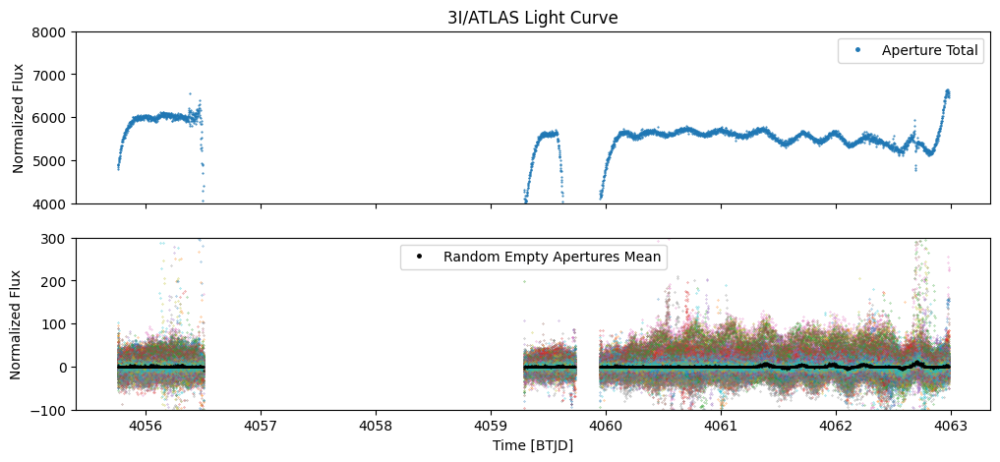

In [83]:
fix_aperture = core_aperture_mask.mean(axis=0).astype(bool)

# we make a collection of random empty apertures
random_empty_ap = []
for dx, dy in zip(np.random.uniform(-25, 25, 1000), np.random.uniform(-45, 45, 1000)):
    # move the aperture to empty regions
    shifted_aperture = ndimage.shift(
        fix_aperture.astype(float),
        shift=(dy, dx),
        order=0,
        mode="nearest",
        prefilter=False,
    ).astype(bool)
    # remove apertures that overlap with the comet aperture
    shifted_aperture &= ~total_aperture_mask
    # compute the fluxes in the random empty aperture
    random_empty_ap.append(
        np.array([flx[shifted_aperture].sum() for flx in mtpf.corr_flux])
    )
random_empty_ap = np.array(random_empty_ap)

fig, ax = plt.subplots(2, 1, figsize=(12, 5), sharex=True)
ax[0].set_title(f"3I/ATLAS Light Curve")
ax[0].plot(
    lc_total["time"].value,
    lc_total["flux"].value,
    # yerr=lc["aperture"][1]["flux_err"],
    ms=1,
    lw=0,
    marker=".",
    label="Aperture Total",
)


for lcf in random_empty_ap[::10]:
    ax[1].plot(lc_total["time"].value, lcf, marker=".", lw=0, ms=0.5)

ax[1].plot(
    lc_total["time"].value,
    np.median(random_empty_ap, axis=0),
    c="k",
    marker=".",
    lw=0,
    ms=1,
    label="Random Empty Apertures Mean",
)

ax[0].legend(loc="best", ncols=1, markerscale=5)
ax[1].legend(loc="best", ncols=1, markerscale=5)

ax[0].set_ylim(4000, 8000)
ax[-1].set_ylim(-100, 300)
ax[-1].set_xlabel("Time [BTJD]")
ax[0].set_ylabel("Normalized Flux")
ax[1].set_ylabel("Normalized Flux")

plt.show()

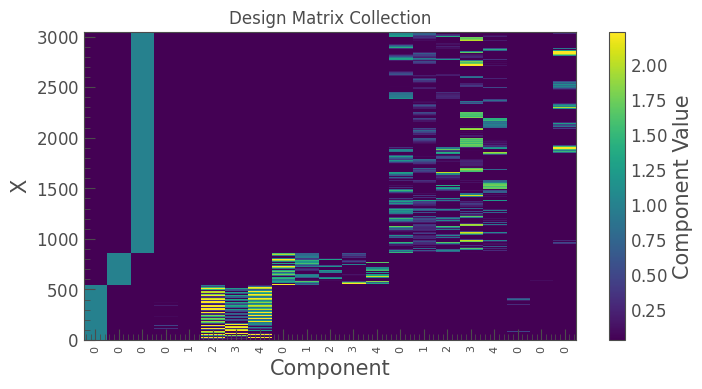

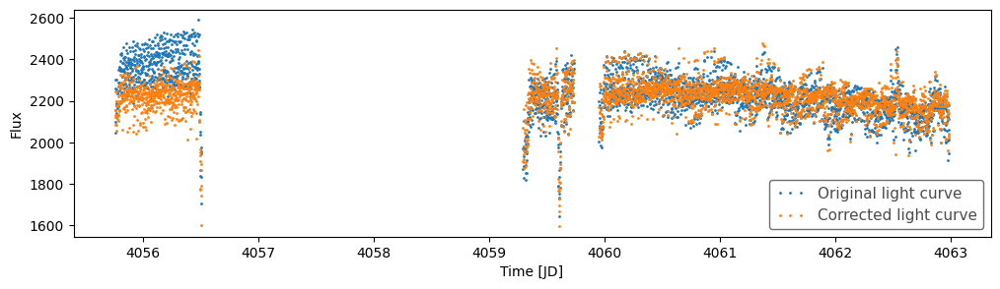

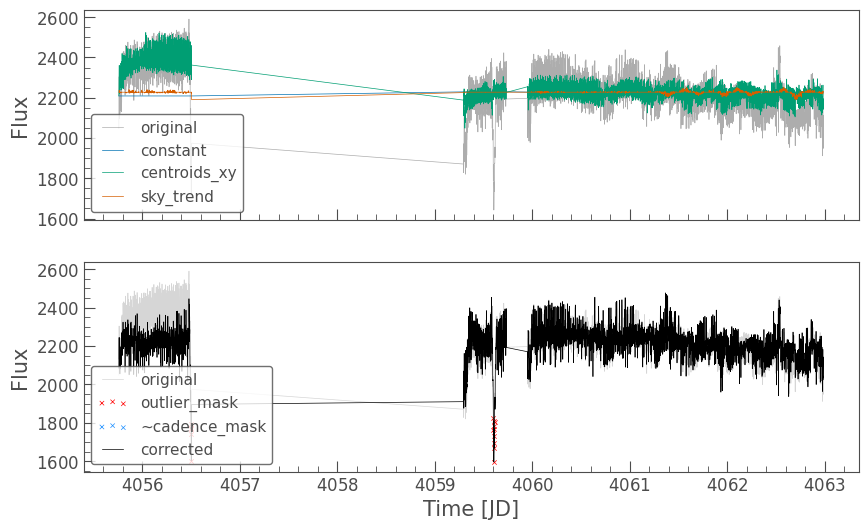

In [84]:
# get the momentum arrays for the corresponding aperture size
regressors = np.array(offsets[lc["aperture"][0]["ap_param"]]).T

# create DM
dm0 = DesignMatrix(np.ones(regressors.shape[0]), name="constant")
dm1 = DesignMatrix(regressors, name="centroids_xy").standardize()
dm2 = DesignMatrix(np.median(random_empty_ap, axis=0), name="sky_trend").standardize()
# find data breaks to account for gaps
breaks = np.where(np.diff(lc_core1["time"]) > 0.1)[0] + 1
# create DM collection and split at data breaks
dmc = DesignMatrixCollection([dm0, dm1, dm2]).split(breaks.tolist())
dmc.plot()
plt.show()
# correct light curve
corrector = RegressionCorrector(lc_core1)
lc_core1_corr = corrector.correct(dmc, sigma=5)

# plot results and diagnostic
fig, ax = plt.subplots(1, 1, figsize=(12, 3))
lc_core1.plot(label="Original light curve", marker=".", lw=0, ax=ax)
lc_core1_corr.plot(ax=ax, label="Corrected light curve", marker=".", lw=0)
# ax.set_ylim(2500, 4500)
plt.show()

corrector.diagnose()
plt.show()

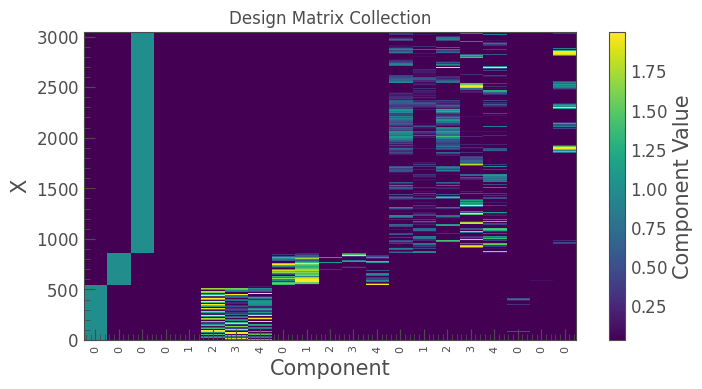

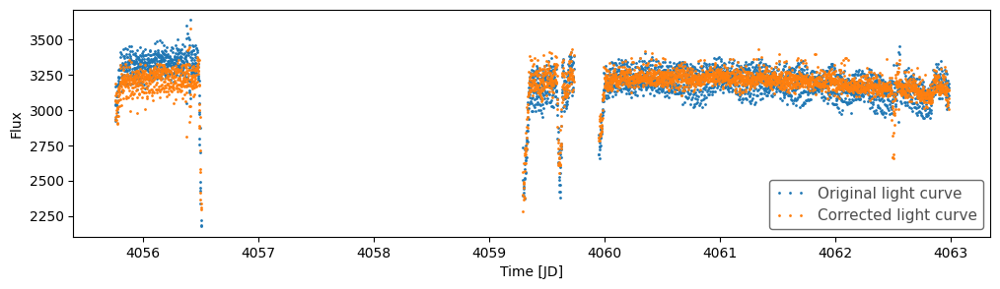

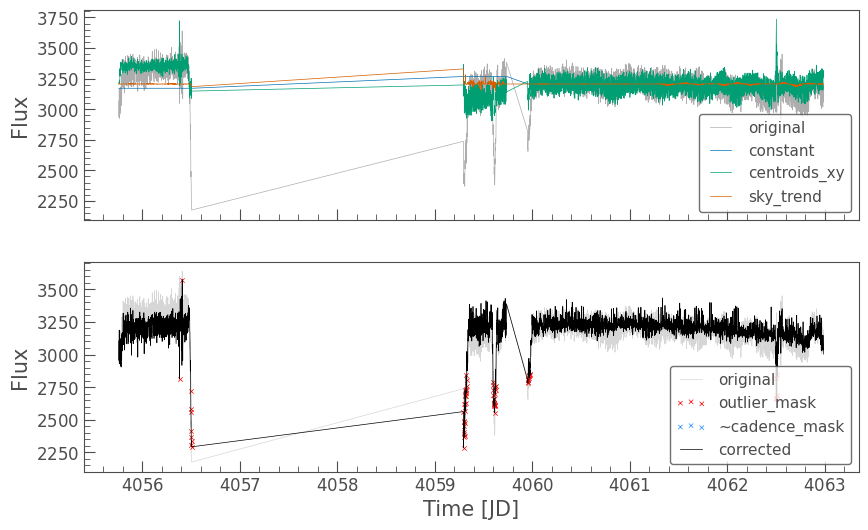

In [85]:
# repeat the process for the larger nuclear aperture
regressors = np.array(offsets[lc["aperture"][1]["ap_param"]]).T

dm0 = DesignMatrix(np.ones(regressors.shape[0]), name="constant")
dm1 = DesignMatrix(regressors, name="centroids_xy").standardize()
dm2 = DesignMatrix(np.median(random_empty_ap, axis=0), name="sky_trend").standardize()

breaks = np.where(np.diff(lc_core2["time"]) > 0.1)[0] + 1
dmc = DesignMatrixCollection([dm0, dm1, dm2]).split(breaks.tolist())
dmc.plot()
plt.show()

corrector = RegressionCorrector(lc_core2)
lc_core2_corr = corrector.correct(dmc, sigma=5)

fig, ax = plt.subplots(1, 1, figsize=(12, 3))
lc_core2.plot(label="Original light curve", marker=".", lw=0, ax=ax)
lc_core2_corr.plot(ax=ax, label="Corrected light curve", marker=".", lw=0)
# ax.set_ylim(2500, 4500)
plt.show()

corrector.diagnose()
plt.show()

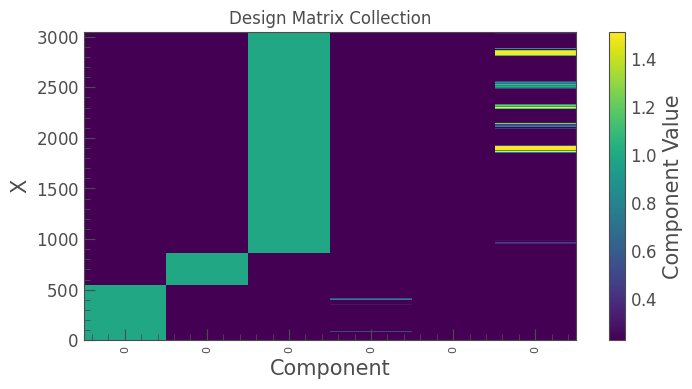

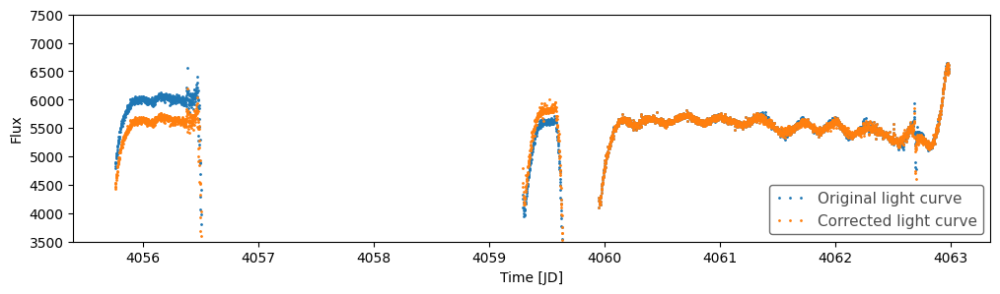

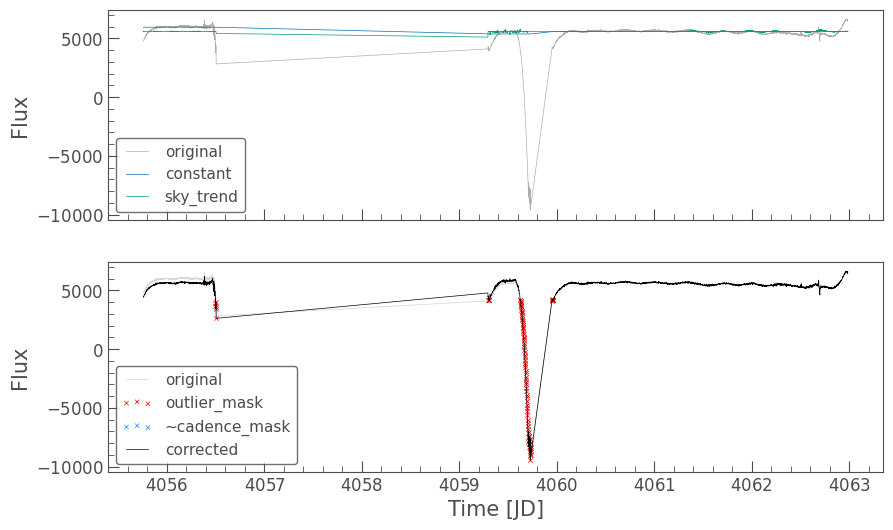

In [86]:
# repeat the process for the total aperture
# this time we will only use the constant and sky trend DMs, as the larger aperture
# is less sensitive to centroid shifts
dmc = DesignMatrixCollection([dm0, dm2]).split(breaks.tolist())
dmc.plot()
plt.show()

corrector = RegressionCorrector(lc_total)
lc_total_corr = corrector.correct(dmc, sigma=5)

fig, ax = plt.subplots(1, 1, figsize=(12, 3))
lc_total.plot(label="Original light curve", marker=".", lw=0, ax=ax)
lc_total_corr.plot(ax=ax, label="Corrected light curve", marker=".", lw=0)
ax.set_ylim(3500, 7500)
plt.show()

corrector.diagnose()
plt.show()

In [92]:
# add corrected light curves to the lc core dictionary
lc["aperture"][0]["flux_corr"] = lc_core1_corr.flux.value
lc["aperture"][0]["flux_err_corr"] = lc_core1_corr.flux_err.value
lc["aperture"][0]["TESSmag_corr"], lc["aperture"][0]["TESSmag_err_corr"], _, _ = (
    calculate_TESSmag(
        lc_core1_corr.flux.value,
        lc_core1_corr.flux_err.value,
        np.ones_like(lc_core1_corr.flux.value),
    )
)
# add corrected light curves to the lc core dictionary
lc["aperture"][1]["flux_corr"] = lc_core2_corr.flux.value
lc["aperture"][1]["flux_err_corr"] = lc_core2_corr.flux_err.value
lc["aperture"][1]["TESSmag_corr"], lc["aperture"][1]["TESSmag_err_corr"], _, _ = (
    calculate_TESSmag(
        lc_core2_corr.flux.value,
        lc_core2_corr.flux_err.value,
        np.ones_like(lc_core2_corr.flux.value),
    )
)
# add corrected light curves to the lc total dictionary
lc["aperture"][-1]["flux_corr"] = lc_total_corr.flux.value
lc["aperture"][-1]["flux_err_corr"] = lc_total_corr.flux_err.value
lc["aperture"][-1]["TESSmag_corr"], lc["aperture"][-1]["TESSmag_err_corr"], _, _ = (
    calculate_TESSmag(
        lc_total_corr.flux.value,
        lc_total_corr.flux_err.value,
        np.ones_like(lc_total_corr.flux.value),
    )
)
# Finally, we save the light curve to a multi extension FITS file:
# custom function to append new columns to the FITS binary table HDU
def append_columns_to_bintable(hdu, data_dict):
    """
    Append new columns to a FITS binary table HDU.
    """
    cards = (
        "AP_TYPE",
        "AP_PAR",
        "AP_NPIX",
        "BAD_BITS",
        "TESSMAG",
    )

    new_dict = {}
    for k, val in data_dict.items():
        if "corr" in k:
            new_dict[k] = val
    new_dict

    name = hdu.header["EXTNAME"]
    orig_table_data = hdu.data
    all_cols = orig_table_data.columns
    for k, val in new_dict.items():
        if "flux" in k:
            unit = "e-/s"
        elif "mag" in k:
            unit = "mag"
        else:
            unit = None
        new_col = fits.Column(name=k.upper(), format="E", array=val, unit=unit, disp="E14.7")
        all_cols += new_col
    new_hdu = fits.BinTableHDU.from_columns(all_cols)
    for card in cards:
        if card in hdu.header:
            new_hdu.header[card] = (hdu.header[card], hdu.header.comments[card])
    new_hdu.header["EXTNAME"] = name

    return new_hdu
# make a new HDU list for the light curve with the corrected fluxes
mtpf.lc_hdulist = mtpf._make_lc_hdulist(lc=lc)

# add corrected light curve to the binary tables
mtpf.lc_hdulist[1] = append_columns_to_bintable(mtpf.lc_hdulist[1], lc["aperture"][0])
mtpf.lc_hdulist[2] = append_columns_to_bintable(mtpf.lc_hdulist[2], lc["aperture"][1])
mtpf.lc_hdulist[3] = append_columns_to_bintable(
    mtpf.lc_hdulist[3], lc["aperture"][2]
    )

# we modify some header cards to reflect the aperture types
mtpf.lc_hdulist[1].header.insert("AP_TYPE", ("APERTURE", "core", "Aperture coverage"), after=False)
mtpf.lc_hdulist[2].header.insert("AP_TYPE", ("APERTURE", "core", "Aperture coverage"), after=False)
mtpf.lc_hdulist[-2].header.insert("AP_TYPE", ("APERTURE", "total", "Aperture coverage"), after=False)
mtpf.lc_hdulist[-2].header["AP_TYPE"] = "stacked-thresh"

# create a new column with the star x core aperture overlap info
new_column_core = fits.Column(name="NPIX_BKGSTAR_CORE", format="I", array=star_x_core)
new_column_total = fits.Column(
    name="NPIX_BKGSTAR_TOTAL", format="I", array=star_x_comet
)

# Access the data from the EXTRA extension
orig_table_data = mtpf.lc_hdulist[-1].data      
orig_cols = orig_table_data.columns
# Combine the original and new columns to create a new BinTableHDU
mtpf.lc_hdulist[-1] = fits.BinTableHDU.from_columns(
    orig_cols + new_column_core + new_column_total
)
mtpf.lc_hdulist[-1].header["EXTNAME"] = "EXTRAS"

print(mtpf.lc_hdulist.info())

# Save TPF and LCF
file_name = f"hlsp_tess-3i_tess_{cadence}_3iatlas-s{sector}-cam{camera}-ccd{ccd}_tess_v{hlsp_ver}_lc.fits"
print(file_name)
mtpf._save_hdulist(file_type="lc", outdir="../../data/2026/", file_name=file_name)

Filename: (No file associated with this HDUList)
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      55   ()      
  1  LIGHTCURVE_AP0    1 BinTableHDU    114   3044R x 27C   ['D', 'I', 'J', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'I', 'E', 'I', 'I', 'E', 'E', 'E', 'E', 'E', 'E']   
  2  LIGHTCURVE_AP1    1 BinTableHDU    114   3044R x 27C   ['D', 'I', 'J', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'I', 'E', 'I', 'I', 'E', 'E', 'E', 'E', 'E', 'E']   
  3  LIGHTCURVE_AP2    1 BinTableHDU    114   3044R x 27C   ['D', 'I', 'J', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'I', 'E', 'I', 'I', 'E', 'E', 'E', 'E', 'E', 'E']   
  4  EXTRAS        1 BinTableHDU     65   3044R x 16C   ['D', 'E', 'D', 'E', 'I', 'I', 'I', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'I', 'I']   
None
hlsp_tess-3i_tess_tpf-20s_3iatlas-s1751-cam2-ccd3_tess_v2.0_lc.fits
